# Trade Strategy 1 with Machine Learning


## Outline:
* Set parameters of interest & Import Data

* Establish Trading Strategy with signals

* Identify Training & Testing dataset, Scale data if necessary

* Run model 1: Support Vector Classifier

    * Evaluate Performance
    * Backtest

* Run model 2: Random Forest Classififier

    * Evaluate Performance
    * Backtest
    
* Run model 2: k Nearest Neighbor Classifier

    * Evaluate Performance
    * Backtest

In [11]:
# Imports
import pandas as pd
import numpy as np
from pathlib import Path
import hvplot.pandas
import matplotlib.pyplot as plt
from finta import TA
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from pandas.tseries.offsets import DateOffset
from sklearn.metrics import classification_report
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import math

### Set Parameters & Import the OHLCV dataset into a Pandas DataFrame.

In [12]:
# choose coin of interest: BTC,ETH,XRP,DOGE,ADA
# choose pair of interest: USD, USDT
coin = 'BTC'
pair = 'USD'

# choose exchange of interest Bitfinex, Binance, Coinbase
exchange = 'Bitfinex'

# choose data interval of interest 1h, 1d
time = '1h'

# get saved histoical csv data from Data folder, which was downloaded from cryptoDataOnline.com
df = pd.read_csv(Path(f"./Data/Formatted_Data/{exchange}/{pair}/{exchange}_{coin}_{time}.csv"), index_col= "Datetime", parse_dates= True, infer_datetime_format = True)
display (df.head())


,Exchange,Symbol_Pair,Open,High,Low,Close,Volume_USD,Volume_in_BTC
Datetime,,,,,,,,
2023-01-12 23:00:00,Bitfinex,BTC/USD,18913.0,18916.0,18856.0,18856.0,2.015120e+06,106.868894
2023-01-12 22:00:00,Bitfinex,BTC/USD,18834.0,18934.0,18785.0,18917.0,1.909037e+06,100.916485
2023-01-12 21:00:00,Bitfinex,BTC/USD,19064.0,19112.0,18775.0,18835.0,5.595288e+06,297.068657
2023-01-12 20:00:00,Bitfinex,BTC/USD,18889.0,19089.0,18828.0,19065.0,1.969036e+06,103.280162
2023-01-12 19:00:00,Bitfinex,BTC/USD,18803.0,19046.0,18771.0,18887.0,5.353192e+06,283.432631


In [13]:
dataframe = df.drop(columns=['Exchange','Symbol_Pair','Volume_in_BTC']).copy()
dataframe = dataframe.rename(columns={'Volume_USD': 'Volume'})
dataframe = dataframe.sort_index(ascending=True)

print(f"The timeframe contained in this dataset is: {dataframe.index.min()} to {dataframe.index.max()}")

The timeframe contained in this dataset is: 2018-05-15 06:00:00 to 2023-01-12 23:00:00


In [14]:
dataframe

,Open,High,Low,Close,Volume
Datetime,,,,,
2018-05-15 06:00:00,8723.8,8793.0,8714.9,8739.0,8.988054e+06
2018-05-15 07:00:00,8739.0,8754.8,8719.3,8743.0,2.288904e+06
2018-05-15 08:00:00,8743.0,8743.1,8653.2,8723.7,8.891773e+06
2018-05-15 09:00:00,8723.7,8737.8,8701.2,8708.1,2.054868e+06
2018-05-15 10:00:00,8708.1,8855.7,8695.8,8784.4,1.730972e+07
...,...,...,...,...,...
2023-01-12 19:00:00,18803.0,19046.0,18771.0,18887.0,5.353192e+06
2023-01-12 20:00:00,18889.0,19089.0,18828.0,19065.0,1.969036e+06
2023-01-12 21:00:00,19064.0,19112.0,18775.0,18835.0,5.595288e+06


## Choose timeframe to be tested with the strategy in the models

In [15]:
# chose start and end times of data to analze
start = '2019-01-01 00:00:00'
end = '2023-01-12 00:00:00'
dataframe = dataframe.loc[start:end ,:]

print(f"Timeframe to be evaluated in strategy and model: {start} to {end}")

Timeframe to be evaluated in strategy and model: 2019-01-01 00:00:00 to 2023-01-12 00:00:00


## Define trading strategy with entry and exit signals

In [16]:
#Strategy 2 SMA, RSI, BBands
dataframe['SMA_long'] = dataframe['Close'].rolling(window=100).mean()
dataframe['SMA_short'] = dataframe['Close'].rolling(window=50).mean()
dataframe['RSI'] = TA.RSI(dataframe, 14) 
dataframe['RSI_mean'] = dataframe['RSI'].mean()
bb_df = TA.BBANDS(dataframe, 20 ,2.5)   
dataframe = pd.concat([dataframe, bb_df], axis=1).dropna()

dataframe.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 35221 entries, 2019-01-05 03:00:00 to 2023-01-12 00:00:00
Data columns (total 12 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       35221 non-null  float64
 1   High       35221 non-null  float64
 2   Low        35221 non-null  float64
 3   Close      35221 non-null  float64
 4   Volume     35221 non-null  float64
 5   SMA_long   35221 non-null  float64
 6   SMA_short  35221 non-null  float64
 7   RSI        35221 non-null  float64
 8   RSI_mean   35221 non-null  float64
 9   BB_UPPER   35221 non-null  float64
 10  BB_MIDDLE  35221 non-null  float64
 11  BB_LOWER   35221 non-null  float64
dtypes: float64(12)
memory usage: 3.5 MB


/opt/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/anaconda3/envs/dev/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

In [17]:
#plot
dataframe.hvplot(x='Datetime', y=['Close', 'SMA_long', 'SMA_short', 'BB_UPPER','BB_MIDDLE', 'BB_LOWER'], value_label='USD')

:NdOverlay   [Variable]
   :Curve   [Datetime]   (USD)

In [18]:
#plot
dataframe.hvplot(x='Datetime', y=['RSI','RSI_mean'])

:NdOverlay   [Variable]
   :Curve   [Datetime]   (value)

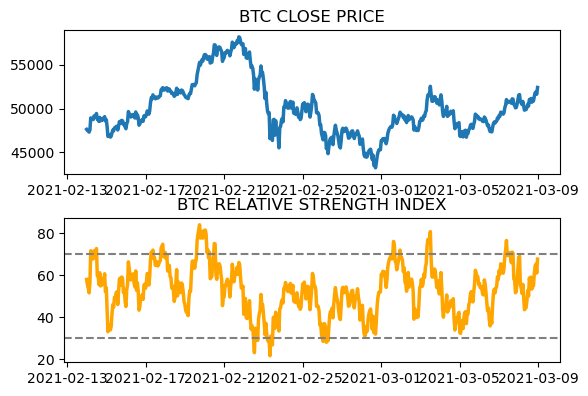

In [19]:
#plot RSI & Close
plot_rsi = dataframe['2021-02-14':'2021-03-08'].copy()
ax1 = plt.subplot2grid((10,1), (0,0), rowspan = 4, colspan = 1)
ax2 = plt.subplot2grid((10,1), (5,0), rowspan = 4, colspan = 1)
ax1.plot(plot_rsi['Close'], linewidth = 2.5)
ax1.set_title('BTC CLOSE PRICE')
ax2.plot(plot_rsi['RSI'], color = 'orange', linewidth = 2.5)
ax2.axhline(30, linestyle = '--', linewidth = 1.5, color = 'grey')
ax2.axhline(70, linestyle = '--', linewidth = 1.5, color = 'grey')
ax2.set_title('BTC RELATIVE STRENGTH INDEX')
plt.show()

# Indicator Signals

In [20]:
# Entry & Exit Signals
dataframe['Signal'] = 0.0

for index, row in dataframe.iterrows():
    if row['Close'] < row['BB_LOWER'] and (row['RSI'] <= 30):
        dataframe.loc[index, 'Signal'] = 1.0 #Buy Signal
    if row['Close'] > row['BB_UPPER'] and (row['RSI'] >= 30):
        dataframe.loc[index, 'Signal'] = -1.0 #Sell Signal
    if row['Close'] > row['BB_LOWER'] and row['Close'] < row['BB_UPPER']:
        dataframe.loc[index, 'Signal'] = 0 #hold signal 

In [21]:
# Entry & Exit Signals                   #Attempt #1 with looping if statements#
# dataframe['Enter/Exit'] = np.nan
# dataframe['Signal'] = 0
# short = 20
# dataframe['ee_price'] = 0

# for index, row in dataframe.iterrows():
        
#     if (row['Close'] < row['BB_LOWER']) and (row['Close'] < row['SMA_long']) and (row['RSI'] <= 30):   #Buy 
#         dataframe.loc[index, 'Signal'] = 1
#         dataframe['ee_price']= dataframe.loc[index, 'Close']                
        
#     elif (row['Close'] > row['BB_UPPER']) and (row['Close'] > row['SMA_long']) and (row['RSI'] >= 30):  #Sell            
#         dataframe.loc[index, 'Signal'] = -1
#         dataframe['ee_price'] = dataframe.loc[index, 'Close']  
    
#     elif (row['Close'] > row['BB_LOWER']) and (row['Close'][short:] > row['ee_price'][short:]):  #Uptrend Hold
#         dataframe.loc[index, 'Signal'] = 1                                   
#     elif (row['Close'] < row['BB_UPPER']) and (row['Close'][short:] < row['ee_price'][short:]):  #Downtrend Hold
#         dataframe.loc[index, 'Signal'] = 1
#     else:
#         dataframe['Signal'] = 0
        
# dataframe["Entry/Exit"] = dataframe['Signal'].diff()

In [22]:
#                             #Attempt #2 with where statements#
# short = 20
# dataframe['Signal'][short:] = np.where(
#     (dataframe['Close'][short:] < dataframe['BB_LOWER'][short:]) &   #Buy  
#     (dataframe['Close'][short:] < dataframe['SMA_long'][short:]) &
#     (dataframe['RSI'][short:] <= 30), 1,0)
 
# dataframe['Signal'][short:] = np.where(
#     (dataframe['Close'][short:] > dataframe['BB_LOWER'][short:]) &   #UPTrend Hold
#     (dataframe['Close'][short:] < dataframe['BB_UPPER'][short:]) &
#     (dataframe['Close'][short:] > dataframe['Close'][short:].shift()), 1,0)

# dataframe['Signal'][short:] = np.where(
#     (dataframe['Close'][short:] > dataframe['BB_UPPER'][short:]) &    #Sell
#     (dataframe['Close'][short:] > dataframe['SMA_long'][short:]) &
#     (dataframe['RSI'][short:] >= 30), -1,0)
    
# dataframe['Signal'][short:] = np.where(
#     (dataframe['Close'][short:] > dataframe['BB_LOWER'][short:]) &   #Downtrend Hold
#     (dataframe['Close'][short:] < dataframe['BB_UPPER'][short:]) &
#     (dataframe['Close'][short:] < dataframe['Close'][short:].shift()), -1,0)

# dataframe["Entry/Exit"] = dataframe['Signal'].diff()

In [23]:
dataframe['Signal'].value_counts()

 0.0    32404
-1.0     2072
 1.0      745
Name: Signal, dtype: int64

In [24]:
# Calculate the strategy returns and add them to the DataFrame
dataframe['Actual Returns'] = dataframe['Close'].pct_change()
dataframe['Strategy Returns'] = dataframe['Actual Returns'] * dataframe['Signal'].shift()

TypeError: unsupported operand type(s) for *: 'AxesSubplot' and 'AxesSubplot'

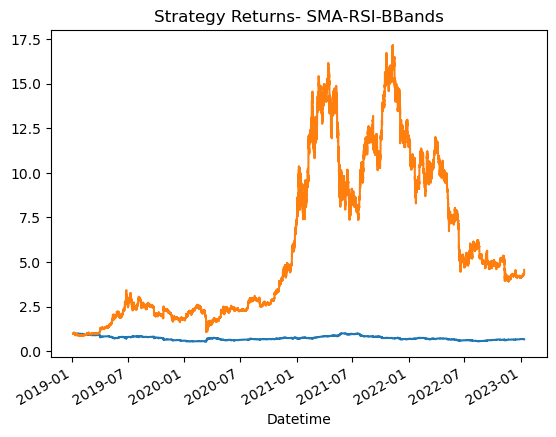

In [25]:
# Plot Strategy Returns to examine performance
strat = (1 + dataframe['Strategy Returns']).cumprod().plot(title="Strategy Returns- SMA-RSI-BBands")
act = (1 + dataframe['Actual Returns']).cumprod().plot()
dual = strat * act
dual

In [26]:
#sum of cumulative product
(1 + dataframe['Actual Returns']).cumprod().sum()

207229.02162189

In [27]:
#sum of cumulative product
(1 + dataframe['Strategy Returns']).cumprod().sum()

26098.933181633078

In [28]:
#Plot
# Visualize exit position relative to close price
entry = dataframe[dataframe["Signal"] == 1.0]["Close"].hvplot.scatter(
    color='green',
    marker='^',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize exit position relative to close price
exit = dataframe[dataframe["Signal"] == -1.0]["Close"].hvplot.scatter(
    color='red',
    marker='v',
    size=200,
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400
)

# Visualize close price for the investment
security_close = dataframe[["Close"]].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400
)

bb_upper = dataframe[["BB_UPPER"]].hvplot(
    line_color='purple',
    ylabel='Price in $',
    width=1000,
    height=400
)


bb_middle = dataframe[["BB_MIDDLE"]].hvplot(
    line_color='orange',
    ylabel='Price in $',
    width=1000,
    height=400
)

bb_lower = dataframe[["BB_LOWER"]].hvplot(
    line_color='blue',
    ylabel='Price in $',
    width=1000,
    height=400
)


# Overlay plots
bbands_plot = security_close * bb_upper * bb_middle * bb_lower * entry * exit
bbands_plot

:Overlay
   .Curve.I          :Curve   [Datetime]   (Close)
   .Curve.II         :Curve   [Datetime]   (BB_UPPER)
   .Curve.III        :Curve   [Datetime]   (BB_MIDDLE)
   .Curve.IV         :Curve   [Datetime]   (BB_LOWER)
   .Scatter.Close.I  :Scatter   [Datetime]   (Close)
   .Scatter.Close.II :Scatter   [Datetime]   (Close)

## Define training and testing datasets

In [29]:
dataframe = dataframe.sort_values(by=["Datetime"], ascending=True)
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 35221 entries, 2019-01-05 03:00:00 to 2023-01-12 00:00:00
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Open              35221 non-null  float64
 1   High              35221 non-null  float64
 2   Low               35221 non-null  float64
 3   Close             35221 non-null  float64
 4   Volume            35221 non-null  float64
 5   SMA_long          35221 non-null  float64
 6   SMA_short         35221 non-null  float64
 7   RSI               35221 non-null  float64
 8   RSI_mean          35221 non-null  float64
 9   BB_UPPER          35221 non-null  float64
 10  BB_MIDDLE         35221 non-null  float64
 11  BB_LOWER          35221 non-null  float64
 12  Signal            35221 non-null  float64
 13  Actual Returns    35220 non-null  float64
 14  Strategy Returns  35220 non-null  float64
dtypes: float64(15)
memory usage: 4.3 MB


In [30]:
# Assign a copy of the sma_fast and sma_slow columns to a features DataFrame called X
X = dataframe.drop(['Signal','Strategy Returns'], axis=1).shift().dropna().copy()
# Create the target set selecting the Signal column and assiging it to y
y = dataframe['Signal'].dropna().copy()

In [31]:
display(X.head(2))
display(X.tail(2))
y.head()

,Open,High,Low,Close,Volume,SMA_long,SMA_short,RSI,RSI_mean,BB_UPPER,BB_MIDDLE,BB_LOWER,Actual Returns
Datetime,,,,,,,,,,,,,
2019-01-05 05:00:00,3997.5,3999.9,3990.1,3992.6,1715675.34,3933.3806,3946.8766,63.192562,50.811205,4018.245632,3932.688,3847.130368,-0.001226
2019-01-05 06:00:00,3992.6,4014.9,3992.6,4011.4,2118887.87,3935.2031,3946.6066,66.776710,50.811205,4029.308781,3936.863,3844.417219,0.004709


,Open,High,Low,Close,Volume,SMA_long,SMA_short,RSI,RSI_mean,BB_UPPER,BB_MIDDLE,BB_LOWER,Actual Returns
Datetime,,,,,,,,,,,,,
2023-01-11 23:00:00,17567.0,17610.0,17530.0,17579.0,5.796229e+06,17223.78,17361.92,69.708876,50.811205,17584.104184,17448.55,17312.995816,0.000626
2023-01-12 00:00:00,17579.0,18009.0,17572.0,17952.0,8.453169e+06,17233.75,17377.28,85.163853,50.811205,17737.041736,17475.20,17213.358264,0.021218


Datetime
2019-01-05 03:00:00    0.0
2019-01-05 04:00:00    0.0
2019-01-05 05:00:00    0.0
2019-01-05 06:00:00    0.0
2019-01-05 07:00:00    0.0
Name: Signal, dtype: float64

In [32]:
display(X.shape)
display(y.shape)
display(X.index.min())
display(X.index.max())
display(y.index.min())
display(y.index.max())

(35219, 13)

(35221,)

Timestamp('2019-01-05 05:00:00')

Timestamp('2023-01-12 00:00:00')

Timestamp('2019-01-05 03:00:00')

Timestamp('2023-01-12 00:00:00')

In [33]:
# Review the value counts
y.value_counts()

 0.0    32404
-1.0     2072
 1.0      745
Name: Signal, dtype: int64

In [34]:
# Select the start of the training period
training_begin = X.index.min()
training_end = X.index.min() + DateOffset(months=3)

# Generate the X_train and y_train DataFrames
X_train = X.loc[training_begin:training_end]
y_train = y.loc[training_begin:training_end]

# Review the X_train DataFrame
display(X_train.head(2))
display(X_train.tail(2))

# Generate the X_test and y_test DataFrames
X_test = X.loc[training_end+DateOffset(hours=1):]
y_test = y.loc[training_end+DateOffset(hours=1):]

# Review the X_test DataFrame
display(X_test.head(2))
display(X_test.tail(2))

,Open,High,Low,Close,Volume,SMA_long,SMA_short,RSI,RSI_mean,BB_UPPER,BB_MIDDLE,BB_LOWER,Actual Returns
Datetime,,,,,,,,,,,,,
2019-01-05 05:00:00,3997.5,3999.9,3990.1,3992.6,1715675.34,3933.3806,3946.8766,63.192562,50.811205,4018.245632,3932.688,3847.130368,-0.001226
2019-01-05 06:00:00,3992.6,4014.9,3992.6,4011.4,2118887.87,3935.2031,3946.6066,66.776710,50.811205,4029.308781,3936.863,3844.417219,0.004709


,Open,High,Low,Close,Volume,SMA_long,SMA_short,RSI,RSI_mean,BB_UPPER,BB_MIDDLE,BB_LOWER,Actual Returns
Datetime,,,,,,,,,,,,,
2019-04-05 04:00:00,4965.00,4965.0,4932.7,4940.34,317839.87,4751.8611,5023.1296,45.982049,50.811205,5088.868091,4974.0660,4859.263909,-0.004967
2019-04-05 05:00:00,4940.34,5014.0,4940.1,4990.95,2247931.29,4759.9376,5021.2286,51.639988,50.811205,5080.627682,4971.1185,4861.609318,0.010244


,Open,High,Low,Close,Volume,SMA_long,SMA_short,RSI,RSI_mean,BB_UPPER,BB_MIDDLE,BB_LOWER,Actual Returns
Datetime,,,,,,,,,,,,,
2019-04-05 06:00:00,4990.95,5068.8,4990.9,5027.85,4987319.74,4768.3191,5020.3120,55.314983,50.811205,5078.141716,4970.4060,4862.670284,0.007393
2019-04-05 07:00:00,5027.85,5027.9,4984.1,4985.93,1083357.39,4776.2584,5020.9966,50.609720,50.811205,5077.885368,4970.2525,4862.619632,-0.008338


,Open,High,Low,Close,Volume,SMA_long,SMA_short,RSI,RSI_mean,BB_UPPER,BB_MIDDLE,BB_LOWER,Actual Returns
Datetime,,,,,,,,,,,,,
2023-01-11 23:00:00,17567.0,17610.0,17530.0,17579.0,5.796229e+06,17223.78,17361.92,69.708876,50.811205,17584.104184,17448.55,17312.995816,0.000626
2023-01-12 00:00:00,17579.0,18009.0,17572.0,17952.0,8.453169e+06,17233.75,17377.28,85.163853,50.811205,17737.041736,17475.20,17213.358264,0.021218


In [35]:
# Create a StandardScaler instance
scaler = StandardScaler()

# Apply the scaler model to fit the X-train data
X_scaler = scaler.fit(X_train)

# Transform the X_train and X_test DataFrames using the X_scaler
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [36]:
# from imblearn.over_sampling import RandomOverSampler
# minority class, or inactive class (1)is increased, so it has same proportion as majority/active class (0)
ros = RandomOverSampler(random_state = 1)
X_resampled, y_resampled = ros.fit_resample(X_train_scaled, y_train)

# from imblearn.under_sampling import RandomUnderSampler
# # majority class, or active class (0)is reduced, so it has same proportion as minority/inactive class (1)
# rus = RandomUnderSampler(sampling_strategy=1)
# X_resampled, y_resampled = rus.fit_resample(X_train_scaled, y_train)

In [ ]:
ax = y_resampled.value_counts().plot.pie(autopct='%.2f')
_ = ax.set_title("Over-sampling")

## Model #1: Support Vector Classifier (SVC) from sklearn library

In [ ]:
# From SVM, instantiate SVC classifier model instance
rbf_svc_model = svm.SVC(kernel='rbf', gamma=0.5, C=0.1)
poly_svc_model = svm.SVC(kernel='poly', degree=3,C=1)
clf = svm.SVC(decision_function_shape='ovo')

rbf_svc_model = rbf_svc_model.fit(X_resampled, y_resampled)
poly_svc_model = poly_svc_model.fit(X_resampled, y_resampled)
clf = clf.fit(X_resampled,y_resampled)

rbf_svc_pred = rbf_svc_model.predict(X_test_scaled)
poly_svc_pred = poly_svc_model.predict(X_test_scaled)
clf_pred = clf.predict(X_test_scaled)

### Evaluation metrics

In [ ]:
y_test.shape

In [ ]:
display(rbf_svc_pred.shape)
display(poly_svc_pred.shape)
display(clf_pred.shape)

In [ ]:
rbf_svc_testing_report = classification_report(y_test, rbf_svc_pred)
print(rbf_svc_testing_report)
poly_svc_testing_report = classification_report(y_test, poly_svc_pred)
print(poly_svc_testing_report)
clf_testing_report = classification_report(y_test, clf_pred)
print(clf_testing_report)

In [ ]:
# Calculate R_Square and Adjusted R Square
# The closer R2 and R2_adj are to 1 the better the model fit
R2rbf = r2_score(y_test, rbf_svc_pred)
R2poly = r2_score(y_test, poly_svc_pred)
R2clf = r2_score(y_test, clf_pred)
#n is the sample size and p is the number of independent variables
R2_adj_rbf = 1-(1-R2rbf)*((len(y_test))-1)/((len(y_test))-1-1)
R2_adj_poly = 1-(1-R2poly)*((len(y_test))-1)/((len(y_test))-1-1)
R2_adj_clf = 1-(1-R2clf)*((len(y_test))-1)/((len(y_test))-1-1)


print("The R squared using the RBF kernel in SVC is", R2rbf)
print ("The R squared adjusted is", R2_adj_rbf)

print("The R squared using the Polynomial kernel in SVC is", R2poly)
print ("The R squared adjusted is", R2_adj_poly)

print("The R squared using the clf kernel in SVC is", R2clf)
print ("The R squared adjusted is", R2_adj_clf

In [ ]:
# Calculate mean squared error and sqr rt of mean squared error
# The closer MSE & srMSE are to 0 the better the model fit
mse_rbf = (mean_squared_error(y_test, rbf_svc_pred))
mse_poly = (mean_squared_error(y_test, poly_svc_pred))
mse_clf = (mean_squared_error(y_test, clf_pred))

sqr_mse_rbf = (math.sqrt(mean_squared_error(y_test, rbf_svc_pred)))
sqr_mse_poly = (math.sqrt(mean_squared_error(y_test, poly_svc_pred)))
sqr_mse_clf = (math.sqrt(mean_squared_error(y_test, clf_pred)))

print(f"The mean square error using the RBF kernel in SVC is", mse_rbf)
print(f"The square root of the mse is", sqr_mse_rbf)
print(f"The mean square error using the Polynomial kernel in SVC is", mse_poly)
print(f"The square root of the mse is", sqr_mse_poly)
print(f"The mean square error using the clf kernel in SVC is", mse_clf)
print(f"The square root of the mse is", sqr_mse_clf)

In [ ]:
X_test.info()

In [ ]:
# Create a predictions DataFrame
predictions_df = pd.DataFrame(index=X_test.index)

# Add the SVM model predictions to the DataFrame
predictions_df['rbfSVC Predicted'] = rbf_svc_pred
predictions_df['polySVC Predicted'] = poly_svc_pred
predictions_df['clfSVC Predicted'] = clf_pred

# Add the actual returns to the DataFrame
predictions_df['Actual Returns'] = dataframe['Actual Returns'].loc['2019-04-21 22:00:00':'2023-01-12 00:00:00']

# Add the strategy returns to the DataFrame
predictions_df['rbfSVC Strategy Returns'] = predictions_df['Actual Returns'] * predictions_df['rbfSVC Predicted']
predictions_df['polySVC Strategy Returns'] = predictions_df['Actual Returns'] * predictions_df['polySVC Predicted']
predictions_df['clfSVC Strategy Returns'] = predictions_df['Actual Returns'] * predictions_df['clfSVC Predicted']


# Review the DataFrame
display(predictions_df.head())
display(predictions_df.tail())

In [ ]:
print('The sum of the cumulative product returns using the RBF Kernel from the Support Vector Classifier is:')
print((1 + predictions_df[['rbfSVC Strategy Returns']]).cumprod().sum())

print('The sum of the cumulative product returns using the Polynomial Kernel from the Support Vector Classifier is:')
print((1 + predictions_df[['polySVC Strategy Returns']]).cumprod().sum())

print('The sum of the cumulative product returns using the clf Kernel from the Support Vector Classifier is:')
print((1 + predictions_df[['clfSVC Strategy Returns']]).cumprod().sum())

In [ ]:
(1 + predictions_df[['Actual Returns']]).cumprod().sum()

In [ ]:
# Plot the actual returns versus the strategy returns
(1 + predictions_df[['rbfSVC Strategy Returns','polySVC Strategy Returns','clf Strategy Returns','Actual Returns']]).cumprod().plot(title="SVC Strategy Returns vs. Actual Returns with Support Vecotr Classifier model")


### Backtest the model 1: SVC to evaluate its performance.

In [ ]:
display(predictions_df.index)
dataframe.index

In [ ]:
# Initial Capital Investment
initial_capital = float(1000)

# Share size of each trade
share_size = 1

backtest_df = pd.DataFrame(index=predictions_df.index)
backtest_df['Close'] = dataframe['Close'].loc['2019-04-21 22:00:00':]

In [ ]:
# Buy a 1 share position when the signal is 1
# Sell a 1 share position when the signal is 0
backtest_df['Position'] = share_size * predictions_df['polySVC Predicted']
# Determine the points in time where a 500 share position is bought or sold
backtest_df['Entry/Exit Position'] = backtest_df['Position'].diff()
# Multiply the close price by the number of shares held, or the Position
backtest_df['Portfolio Holdings'] = backtest_df['Close'] * backtest_df['Position']
# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
backtest_df['Portfolio Cash'] = initial_capital - (backtest_df['Close'] * backtest_df['Entry/Exit Position']).cumsum()
# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
backtest_df['Portfolio Total'] = backtest_df['Portfolio Cash'] + backtest_df['Portfolio Holdings']
# Calculate the portfolio daily returns
backtest_df['Portfolio Daily Returns'] = backtest_df['Portfolio Total'].pct_change()
# Calculate the portfolio cumulative returns
backtest_df['Portfolio Cumulative Returns'] = (1 + backtest_df['Portfolio Daily Returns']).cumprod() - 1
backtest_df.tail(10)

In [ ]:
# Visualize exit position relative to total portfolio value
exit = backtest_df[backtest_df['Entry/Exit Position'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='yellow',
    marker='v',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
entry = backtest_df[backtest_df['Entry/Exit Position'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='purple',
    marker='^',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize the value of the total portfolio
total_portfolio_value = backtest_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)

# Overlay the plots
portfolio_entry_exit_plot = total_portfolio_value * entry * exit
portfolio_entry_exit_plot.opts(
    title="BTC Algorithm with polySVC Preditions- Total Portfolio Value",
    yformatter='%.0f'
)

## Model #2: Random Forest Classifier from sklearn library

In [ ]:
# Initiate the model instance
RFC = RandomForestClassifier(max_depth=6, random_state=1)

# Fit the model using the training data
model = RFC.fit(X_train, y_train)

# Use the testing dataset to generate the predictions for the new model
forest_pred = RFC.predict(X_test)

# Review the model's predicted values
forest_pred[:10]

### Evaluation Metrics

In [ ]:
# Use a classification report to evaluate the model using the predictions and testing data
forest_pred_report = classification_report(y_test, forest_pred)

# Print the classification report
print(forest_pred_report)


In [ ]:
# Calculate R_Square and Adjusted R Square
# The closer R2 and R2_adj are to 1 the better the model fit
R2 = r2_score(y_test, forest_pred)
#n is the sample size and p is the number of independent variables
R2_adj = 1-(1-R2)*((len(y_test))-1)/((len(y_test))-1-1)
print("The R squared is", R2)
print ("The R squared adjusted is", R2_adj)

In [ ]:
# Calculate mean squared error and sqr rt of mean squared error
# The closer MSE & srMSE are to 0 the better the model fit
mse = (mean_squared_error(y_test, forest_pred))
sqr_mse = (math.sqrt(mean_squared_error(y_test, forest_pred)))
print(f"The mean square error is", mse)
print(f"The square root of the mse is", sqr_mse)

In [ ]:
# Add RVR model predictions to predicitons dataframe
predictions_df['RFC Predictions'] = forest_pred
predictions_df['Actual Returns'] = dataframe['Actual Returns'].loc['2019-04-01 02:00:00':'2023-01-11 05:00:00']
predictions_df['RFC Strategy Returns'] = predictions_df['Actual Returns'] * predictions_df['RFC Predictions']

# Review the DataFrame
predictions_df

In [ ]:
(1 + predictions_df[['RFC Strategy Returns']]).cumprod().sum()

In [ ]:
(1 + predictions_df[['Actual Returns']]).cumprod().sum()

In [ ]:
# Plot the actual returns versus the strategy returns
(1 + predictions_df[['RFC Strategy Returns','Actual Returns']]).cumprod().plot(title="RFC Strategy Returns vs. Actual with Random Forest Classifier model, 2021-2022")

### Backtest the model 2: RVC to evaluate its performance. 

In [ ]:
# Initial Capital Investment
initial_capital = float(1000)

# Share size of each trade
share_size = 1

backtest_df = pd.DataFrame(index=predictions_df.index)
backtest_df['Close'] = dataframe['Close'].loc['2019-04-21 22:00:00':]

In [ ]:
# Buy a 1 share position when the signal is 1
# Sell a 1 share position when the signal is 0
backtest_df['Position'] = share_size * predictions_df['RFC Predictions']
# Determine the points in time where a 500 share position is bought or sold
backtest_df['Entry/Exit Position'] = backtest_df['Position'].diff()
# Multiply the close price by the number of shares held, or the Position
backtest_df['Portfolio Holdings'] = backtest_df['Close'] * backtest_df['Position']
# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
backtest_df['Portfolio Cash'] = initial_capital - (backtest_df['Close'] * backtest_df['Entry/Exit Position']).cumsum()
# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
backtest_df['Portfolio Total'] = backtest_df['Portfolio Cash'] + backtest_df['Portfolio Holdings']
# Calculate the portfolio daily returns
backtest_df['Portfolio Daily Returns'] = backtest_df['Portfolio Total'].pct_change()
# Calculate the portfolio cumulative returns
backtest_df['Portfolio Cumulative Returns'] = (1 + backtest_df['Portfolio Daily Returns']).cumprod() - 1
backtest_df.tail(10)

In [ ]:
# Visualize exit position relative to total portfolio value
exit = backtest_df[backtest_df['Entry/Exit Position'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='yellow',
    marker='v',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
entry = backtest_df[backtest_df['Entry/Exit Position'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='purple',
    marker='^',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize the value of the total portfolio
total_portfolio_value = backtest_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)

# Overlay the plots
portfolio_entry_exit_plot = total_portfolio_value * entry * exit
portfolio_entry_exit_plot.opts(
    title="BTC Algorithm with RFC Preditions- Total Portfolio Value",
    yformatter='%.0f'
)

## Model #3: KNearest Neighbors Classifier (kNN) from sklearn library

In [ ]:
kNN = KNeighborsClassifier(n_neighbors = 12)
kNN = kNN.fit(X_resampled, y_resampled)
kNN_pred = kNN.predict(X_test_scaled)



### Evaluation Metrics

In [ ]:
# Use a classification report to evaluate the model using the predictions and testing data
kNN_pred_report = classification_report(y_test, kNN_pred)

# Print the classification report
print(kNN_pred_report)


In [ ]:
# Calculate R_Square and Adjusted R Square
# The closer R2 and R2_adj are to 1 the better the model fit
R2 = r2_score(y_test, kNN_pred)
#n is the sample size and p is the number of independent variables
R2_adj = 1-(1-R2)*((len(y_test))-1)/((len(y_test))-1-1)
print("The R squared is", R2)
print ("The R squared adjusted is", R2_adj)

In [ ]:
# Calculate mean squared error and sqr rt of mean squared error
# The closer MSE & srMSE are to 0 the better the model fit
mse = (mean_squared_error(y_test, kNN_pred))
sqr_mse = (math.sqrt(mean_squared_error(y_test, kNN_pred)))
print(f"The mean square error is", mse)
print(f"The square root of the mse is", sqr_mse)

In [ ]:

# Add the kNN model predictions to the DataFrame
predictions_df['kNN Predictions'] = kNN_pred
predictions_df['Actual Returns'] = dataframe['Actual Returns'].loc['2019-04-01 02:00:00':'2023-01-11 05:00:00']
# Add the strategy returns to the DataFrame
predictions_df['kNN Strategy Returns'] = predictions_df['Actual Returns'] * predictions_df['kNN Predictions']


In [ ]:
# Plot the actual returns versus the strategy returns
(1 + predictions_df[['kNN Strategy Returns','Actual Returns']]).cumprod().plot(title="kNN Strategy Returns vs. Actual with kNearest Neighbor Classifier model")

### Backtest the model 3: kNN to evaluate its performance. 

In [ ]:
# Initial Capital Investment
initial_capital = float(1000)

# Share size of each trade
share_size = 1

backtest_df = pd.DataFrame(index=predictions_df.index)
backtest_df['Close'] = dataframe['Close'].loc['2019-04-21 22:00:00':'2023-01-12 00:00:00']

In [ ]:
# Buy a 1 share position when the signal is 1
# Sell a 1 share position when the signal is 0
backtest_df['Position'] = share_size * predictions_df['kNN Predictions']
# Determine the points in time where a 500 share position is bought or sold
backtest_df['Entry/Exit Position'] = backtest_df['Position'].diff()
# Multiply the close price by the number of shares held, or the Position
backtest_df['Portfolio Holdings'] = backtest_df['Close'] * backtest_df['Position']
# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
backtest_df['Portfolio Cash'] = initial_capital - (backtest_df['Close'] * backtest_df['Entry/Exit Position']).cumsum()
# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
backtest_df['Portfolio Total'] = backtest_df['Portfolio Cash'] + backtest_df['Portfolio Holdings']
# Calculate the portfolio daily returns
backtest_df['Portfolio Daily Returns'] = backtest_df['Portfolio Total'].pct_change()
# Calculate the portfolio cumulative returns
backtest_df['Portfolio Cumulative Returns'] = (1 + backtest_df['Portfolio Daily Returns']).cumprod() - 1
backtest_df.tail(10)

In [ ]:
# Visualize exit position relative to total portfolio value
exit = backtest_df[backtest_df['Entry/Exit Position'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='yellow',
    marker='v',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
entry = backtest_df[backtest_df['Entry/Exit Position'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='purple',
    marker='^',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize the value of the total portfolio
total_portfolio_value = backtest_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)

# Overlay the plots
portfolio_entry_exit_plot = total_portfolio_value * entry * exit
portfolio_entry_exit_plot.opts(
    title="BTC Algorithm with kNN Preditions- Total Portfolio Value",
    yformatter='%.0f'
)